# Business Analytics Airbnb Project 
Project by:

Jonathan Hjortshøj-Nielsen, s194809

Johan Østergaard Knarreborg, s191439

Ellen Winther Mortensen, s184313



## Introduction

This project seeks to predict prices on listings at airbnb in Copenhagen. In this project we will try to predict if prices are high or low(binary classification) and if prices are high, medium or low(multiclass classification). We have the following research questions 
- Which variables are important to describe the patterns in the data?
- Which variables are important in the logistic regression?
- Can additional information about location improve the results?

In [3]:
#Importing Modules
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
from matplotlib.pyplot import figure
import seaborn as sns
from sklearn.model_selection import train_test_split
plt.rcParams['figure.figsize'] = (10, 8)
import folium
from sklearn import decomposition


## Data Analysis and Visualisations

In this section we will explore the data and visualise it. 

In [4]:
df = pd.read_csv('listings_CPH.csv')
df_orig = df

In [5]:
#split to training and test data
df_training, df_test = train_test_split(df, test_size = 0.2, random_state = 42)

df_test = df_test.reset_index(drop = True)
df = df_training.reset_index(drop = True)

In [6]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,3227556,New Yorker inspired 2-bedroom apartment,16336315,Emilie,NaN,Amager st,55.667763,12.616899,Entire home/apt,1500,3,0,NaN,NaN,1,53,0,NaN
1,49343923,Bright and cosy apartment in great area,398030948,Kaisa,NaN,Valby,55.666680,12.520240,Entire home/apt,618,7,19,2022-09-12,1.42,1,0,16,NaN
2,42133582,Modern and cozy 2 rooms apartment,3657383,Fernando,NaN,Amager st,55.666190,12.615660,Entire home/apt,600,4,7,2021-12-05,0.22,1,0,2,NaN
3,19927661,Cozy appartment in Copenhagen N.,133394537,Charlotte,NaN,Nrrebro,55.700290,12.550360,Entire home/apt,333,2,55,2021-08-22,0.87,1,0,0,NaN
4,42106576,"PSG 23 - Mini Suite, Best Location",121840928,Living Suites,NaN,Indre By,55.678430,12.590430,Entire home/apt,1350,3,14,2022-08-15,0.50,2,135,11,NaN


In [7]:
#check for columns that consists of only null values
for col in df.columns: 
  r = sum(df[col].isna())/df[col].size
  print(str(col)+' '+str(r))

id 0.0
name 0.0
host_id 0.0
host_name 9.048136083966703e-05
neighbourhood_group 1.0
neighbourhood 0.0
latitude 0.0
longitude 0.0
room_type 0.0
price 0.0
minimum_nights 0.0
number_of_reviews 0.0
last_review 0.11844010133912414
reviews_per_month 0.11844010133912414
calculated_host_listings_count 0.0
availability_365 0.0
number_of_reviews_ltm 0.0
license 1.0


In [8]:
#data without neighbourhood_group and license(that consists of only Null values)
df = df[['id', 'name', 'host_id', 'host_name', 'neighbourhood', 
         'latitude', 'longitude', 'room_type', 'price', 
         'minimum_nights', 'number_of_reviews', 'last_review', 
         'reviews_per_month', 'calculated_host_listings_count', 
         'availability_365', 'number_of_reviews_ltm']]

In [9]:
#check for columns that consists of only null values
for col in df.columns: 
  print(col, df[col].isnull().sum())

id 0
name 0
host_id 0
host_name 1
neighbourhood 0
latitude 0
longitude 0
room_type 0
price 0
minimum_nights 0
number_of_reviews 0
last_review 1309
reviews_per_month 1309
calculated_host_listings_count 0
availability_365 0
number_of_reviews_ltm 0


In [10]:
#set null values in reviews per months as 0
df['reviews_per_month'] = df['reviews_per_month'].fillna(0)

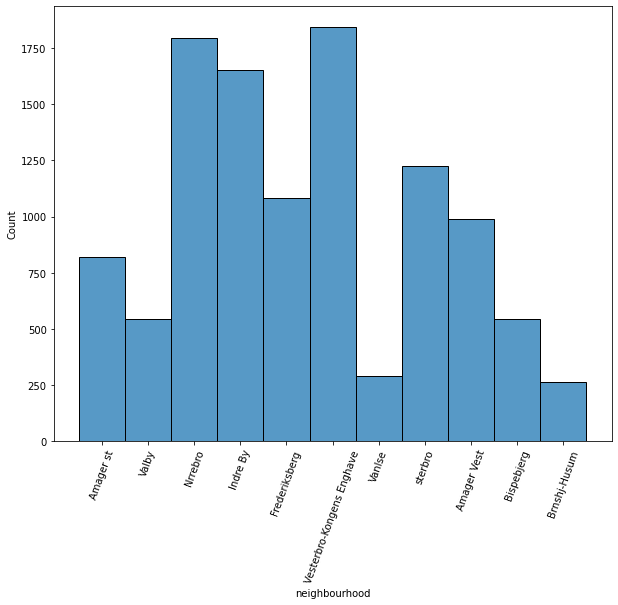

In [11]:
#count of listings at neighbourhoods
sns.histplot(data = df, x = 'neighbourhood')
plt.xticks(rotation=70)
plt.show()

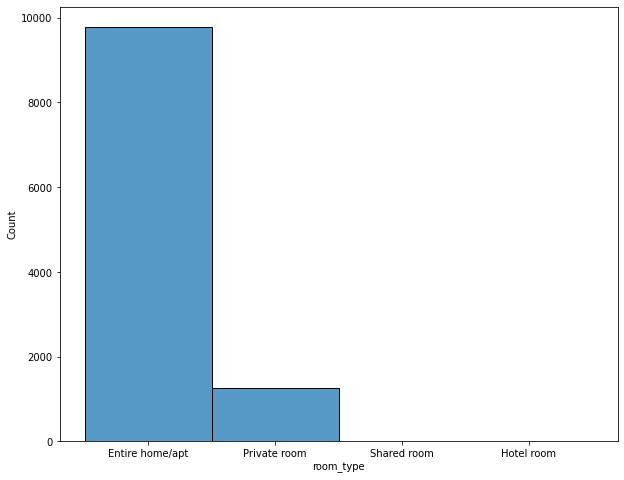

In [12]:
#count of room type
sns.histplot(data = df, x = 'room_type')
plt.show()

In [13]:
room_count = df.groupby('room_type').count()

# %of listings as each room type
room_count['id']/len(df)*100

room_type
Entire home/apt    88.418386
Hotel room          0.126674
Private room       11.310170
Shared room         0.144770
Name: id, dtype: float64

In [14]:
#number of listings for each host
listingsCount = df.groupby('host_id').count()
listingsCount

,id,name,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
host_id,,,,,,,,,,,,,,,
11718,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
12155,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
16774,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
18968,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
21375,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
479904066,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1
480156533,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1
480322216,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1


In [15]:
#number of hosts with more than one listing
listingsCount[listingsCount.id > 1]

,id,name,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
host_id,,,,,,,,,,,,,,,
112210,3,3,3,3,3,3,3,3,3,3,2,3,3,3,3
126777,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3
140105,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
150042,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
178320,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
461726397,15,15,15,15,15,15,15,15,15,15,11,15,15,15,15
463539264,6,6,6,6,6,6,6,6,6,6,4,6,6,6,6
463667831,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2


In [16]:
#fraction with more than one listing
len(listingsCount[listingsCount.id > 1])/len(listingsCount)

0.047960199004975126

In [17]:
# host_id 126777
df[df.host_id == 126777]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
6206,768831,"Loft room in ""B.I.G."" apartment",126777,Søren,Amager Vest,55.63558,12.58183,Private room,750,1,66,2022-05-01,0.56,3,327,4
10632,768784,"Amazing room in ""B.I.G"" apartment",126777,Søren,Amager Vest,55.63094,12.58127,Private room,950,1,99,2022-09-01,0.87,3,304,11
11011,768646,"Architectural icon by ""B.I.G.""",126777,Søren,Amager Vest,55.63363,12.58177,Entire home/apt,1450,2,116,2022-09-12,1.03,3,326,19


In [18]:
CPH = folium.Map([55.6304, 12.58127], zoom_start=15)
folium.CircleMarker(location = [55.63094, 12.58127]).add_to(CPH)
folium.CircleMarker(location = [55.63363, 12.58177]).add_to(CPH)
folium.CircleMarker(location = [55.63558, 12.58183]).add_to(CPH)
CPH

In [19]:
#listings with calcualted hosts listings count above 1
df[df.calculated_host_listings_count > 1]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
4,42106576,"PSG 23 - Mini Suite, Best Location",121840928,Living Suites,Indre By,55.678430,12.590430,Entire home/apt,1350,3,14,2022-08-15,0.50,2,135,11
6,34839631,Liebhaver-lejlighed i København tæt på centrum.,257193517,Tania,Vesterbro-Kongens Enghave,55.670030,12.543230,Entire home/apt,2500,4,1,2019-08-04,0.03,2,5,0
24,33859770,"Cosy apartment in the center of Valby, Copenhagen",71023305,Sarah,Valby,55.662380,12.509430,Entire home/apt,800,10,13,2021-09-24,0.32,2,180,1
25,14737946,Central Copenhagen - room for the cosy ones,44154045,Louise,Indre By,55.686190,12.592320,Private room,743,3,60,2022-08-20,0.81,2,260,8
38,596037333649357835,Spacious unique apartment with roof terrace,452342826,Anne Mette,Vesterbro-Kongens Enghave,55.662790,12.546190,Entire home/apt,1050,3,6,2022-08-08,2.31,2,0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11016,47106638,Modern and spacious 4 room apartment with private,155348640,Forenom Denmark,Vesterbro-Kongens Enghave,55.646650,12.551450,Entire home/apt,7429,1,0,NaN,0.00,82,0,0
11020,637482347549603670,Room in apartment close to water and city center,98908744,Mie,sterbro,55.707703,12.596148,Private room,1000,1,10,2022-08-27,2.59,2,267,10
11027,38138215,Central copenhagen\nWaterfront Property,61827420,Steffen,Amager Vest,55.661260,12.570180,Private room,980,1,2,2019-09-26,0.05,2,0,0
11035,50355648,Penthouse with a view - Bedroom only,3549909,Per,Vesterbro-Kongens Enghave,55.646140,12.547680,Entire home/apt,750,1,2,2021-08-11,0.14,2,50,0


In [20]:
#listings for host 155348640
df[df.host_id == 155348640]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
281,46956178,"2 bedroom light, modern apartment with balcony",155348640,Forenom Denmark,Valby,55.65880,12.51207,Entire home/apt,7429,1,0,NaN,0.00,82,0,0
821,46956251,2 bedroom apartment at the Copenhagen Harbor.,155348640,Forenom Denmark,Vesterbro-Kongens Enghave,55.64809,12.55273,Entire home/apt,7429,1,0,NaN,0.00,82,0,0
882,21438022,Nice and stylish and modern furnished 2 Bedroom,155348640,Forenom Denmark,sterbro,55.71270,12.56530,Entire home/apt,7429,1,2,2021-08-21,0.08,82,0,0
1089,30160043,"2 bedroom light, modern apartment",155348640,Forenom Denmark,Valby,55.65835,12.51147,Entire home/apt,1487,1,0,NaN,0.00,82,365,0
1667,47106641,4 room apartment - 97 sqm with balcony,155348640,Forenom Denmark,Brnshj-Husum,55.72573,12.47232,Entire home/apt,7429,1,0,NaN,0.00,82,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10563,21437943,"Newly renovated, wonderful, and light three ro...",155348640,Forenom Denmark,Vesterbro-Kongens Enghave,55.65317,12.54946,Entire home/apt,7429,2,0,NaN,0.00,82,0,0
10820,21437709,Teglholmsgade. Close to public transportation and,155348640,Forenom Denmark,Vesterbro-Kongens Enghave,55.64935,12.55488,Entire home/apt,2374,3,9,2022-08-25,0.34,82,329,3
10878,30160048,Modern bright 2 bedroom apartment with balcony,155348640,Forenom Denmark,Valby,55.65856,12.51015,Entire home/apt,1487,1,0,NaN,0.00,82,365,0
10883,47106654,3 bedroom apartment at the Copenhagen Harbor.,155348640,Forenom Denmark,Vesterbro-Kongens Enghave,55.64907,12.55260,Entire home/apt,7429,1,0,NaN,0.00,82,0,0


In [21]:
CPH = folium.Map([55.6761, 12.5689], zoom_start=12)
locations_lat = list(df[df.host_id == 155348640]['latitude'])
locations_lon = list(df[df.host_id == 155348640]['longitude'])
for i in range(np.size(df[df.host_id == 155348640],axis=0)): 
  folium.CircleMarker(location = [locations_lat[i], locations_lon[i]]).add_to(CPH)
CPH

In [22]:
#min nights
min_nights = df.groupby('minimum_nights').count()
min_nights[0:10]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
minimum_nights,,,,,,,,,,,,,,,
1,1850,1850,1850,1850,1850,1850,1850,1850,1850,1850,1496,1850,1850,1850,1850
2,2930,2930,2930,2929,2930,2930,2930,2930,2930,2930,2712,2930,2930,2930,2930
3,2500,2500,2500,2500,2500,2500,2500,2500,2500,2500,2264,2500,2500,2500,2500
4,1348,1348,1348,1348,1348,1348,1348,1348,1348,1348,1234,1348,1348,1348,1348
5,1081,1081,1081,1081,1081,1081,1081,1081,1081,1081,955,1081,1081,1081,1081
6,347,347,347,347,347,347,347,347,347,347,301,347,347,347,347
7,429,429,429,429,429,429,429,429,429,429,356,429,429,429,429
8,24,24,24,24,24,24,24,24,24,24,23,24,24,24,24
9,13,13,13,13,13,13,13,13,13,13,10,13,13,13,13


In [23]:
min_nights.tail()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
minimum_nights,,,,,,,,,,,,,,,
365,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
400,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
500,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
600,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1111,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


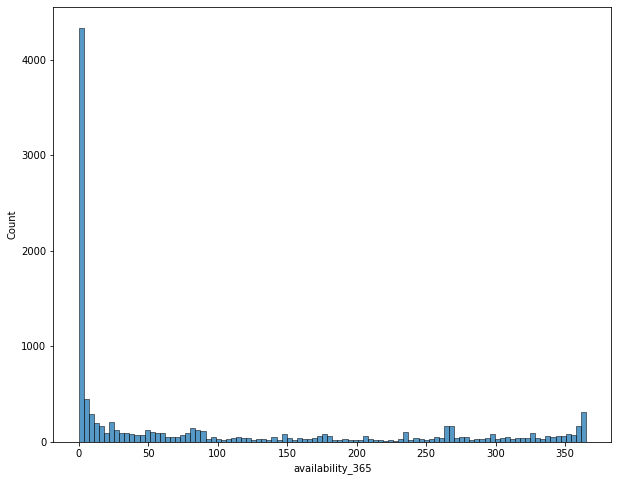

In [24]:
#plot of availability 
sns.histplot(data = df, x = "availability_365", bins = 100)
plt.show()

In [25]:
#count of listings with different values of availability
df.groupby("availability_365").count()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,number_of_reviews_ltm
availability_365,,,,,,,,,,,,,,,
0,3858,3858,3858,3857,3858,3858,3858,3858,3858,3858,3858,3444,3858,3858,3858
1,204,204,204,204,204,204,204,204,204,204,204,197,204,204,204
2,142,142,142,142,142,142,142,142,142,142,142,138,142,142,142
3,129,129,129,129,129,129,129,129,129,129,129,123,129,129,129
4,130,130,130,130,130,130,130,130,130,130,130,120,130,130,130
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
361,16,16,16,16,16,16,16,16,16,16,16,13,16,16,16
362,44,44,44,44,44,44,44,44,44,44,44,40,44,44,44
363,41,41,41,41,41,41,41,41,41,41,41,31,41,41,41


In [26]:
#fraction of listings that are never available
df.groupby("availability_365").count().iloc[0][0]/len(df)

0.3490770901194354

In [27]:
#availability at 0 and number of reviews above 0
df[(df.availability_365 == 0) & (df.number_of_reviews!= 0)]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
1,49343923,Bright and cosy apartment in great area,398030948,Kaisa,Valby,55.66668,12.520240,Entire home/apt,618,7,19,2022-09-12,1.42,1,0,16
2,42133582,Modern and cozy 2 rooms apartment,3657383,Fernando,Amager st,55.66619,12.615660,Entire home/apt,600,4,7,2021-12-05,0.22,1,0,2
3,19927661,Cozy appartment in Copenhagen N.,133394537,Charlotte,Nrrebro,55.70029,12.550360,Entire home/apt,333,2,55,2021-08-22,0.87,1,0,0
5,13458710,Perfekt lejlighed til børnefamilien og par,76906928,Jane,Frederiksberg,55.67364,12.501180,Entire home/apt,1095,3,24,2018-05-20,0.32,1,0,0
10,581894275549751259,Central apartment in Copenhagen with 2 balconies,48497844,Denja,sterbro,55.71222,12.566570,Entire home/apt,800,3,4,2022-07-14,0.74,1,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11036,638081101378016174,Hyggelig lejlighed med altan og gårdhave.,121622491,Niklas,Indre By,55.69772,12.590717,Entire home/apt,900,1,3,2022-07-21,1.03,1,0,3
11039,33784395,Unique central apartment with private garden,185886947,Stina,Amager Vest,55.66549,12.596730,Entire home/apt,850,2,20,2020-08-07,0.48,1,0,0
11040,25942883,"Raw flat in the heart of Vesterbro, Copenhagen",62385415,Benjamin,Vesterbro-Kongens Enghave,55.67187,12.545770,Entire home/apt,875,3,29,2022-09-19,0.58,1,0,14
11043,37002689,Cosy and light home in hip CPH V,31239420,Lars,Vesterbro-Kongens Enghave,55.66664,12.548210,Entire home/apt,700,4,12,2021-02-15,0.32,1,0,0


In [28]:
#availability at 0 and number of reviews_in the last 12 months above 0
df[(df.availability_365 == 0) & (df.number_of_reviews_ltm != 0)]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
1,49343923,Bright and cosy apartment in great area,398030948,Kaisa,Valby,55.66668,12.520240,Entire home/apt,618,7,19,2022-09-12,1.42,1,0,16
2,42133582,Modern and cozy 2 rooms apartment,3657383,Fernando,Amager st,55.66619,12.615660,Entire home/apt,600,4,7,2021-12-05,0.22,1,0,2
10,581894275549751259,Central apartment in Copenhagen with 2 balconies,48497844,Denja,sterbro,55.71222,12.566570,Entire home/apt,800,3,4,2022-07-14,0.74,1,0,4
17,630070800742648507,Bright and sunny family villa with lush garden,758145,Tine,Amager st,55.64316,12.620830,Entire home/apt,2200,4,2,2022-07-23,0.86,1,0,2
19,51536770,Cozy two room apartment near Valby Station,180116772,Emiliano,Valby,55.66154,12.511570,Entire home/apt,410,5,3,2022-01-05,0.22,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11029,31891913,Top floor with Balcony in the heart of Vesterbro,38361468,Astrid,Vesterbro-Kongens Enghave,55.67169,12.556190,Entire home/apt,1000,4,10,2022-07-12,0.22,1,0,2
11032,615066366190376312,Nørrebro center,65234671,Harald,Nrrebro,55.69590,12.540770,Private room,600,1,14,2022-09-12,3.50,1,0,14
11034,7497390,90 sunny sqm close to city center,38014894,Josefine,Vesterbro-Kongens Enghave,55.66638,12.548940,Entire home/apt,1000,3,34,2022-09-06,0.39,1,0,4
11036,638081101378016174,Hyggelig lejlighed med altan og gårdhave.,121622491,Niklas,Indre By,55.69772,12.590717,Entire home/apt,900,1,3,2022-07-21,1.03,1,0,3


In [29]:
#number of listings with availability at 0, but don't have any reviews
len(df[(df.availability_365 == 0) & (df.number_of_reviews == 0)])

414

In [30]:
#fraction of the listings with availability at 0, that has no reviews
(len(df[(df.availability_365 == 0) & (df.number_of_reviews == 0)]))/len(df[df.availability_365 == 0])

0.10730948678071539

In [31]:
#fraction of all listings, that has nore reviews and has availability 0
(len(df[(df.availability_365 == 0) & (df.number_of_reviews == 0)]))/len(df)

0.03745928338762215

In [32]:
#list of number of listings with different number of reviews in last 12 months
reviews_count = df.groupby("number_of_reviews_ltm").count()
reviews_count

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
number_of_reviews_ltm,,,,,,,,,,,,,,,
0,3122,3122,3122,3121,3122,3122,3122,3122,3122,3122,3122,1813,3122,3122,3122
1,1227,1227,1227,1227,1227,1227,1227,1227,1227,1227,1227,1227,1227,1227,1227
2,1098,1098,1098,1098,1098,1098,1098,1098,1098,1098,1098,1098,1098,1098,1098
3,956,956,956,956,956,956,956,956,956,956,956,956,956,956,956
4,774,774,774,774,774,774,774,774,774,774,774,774,774,774,774
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
216,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
275,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


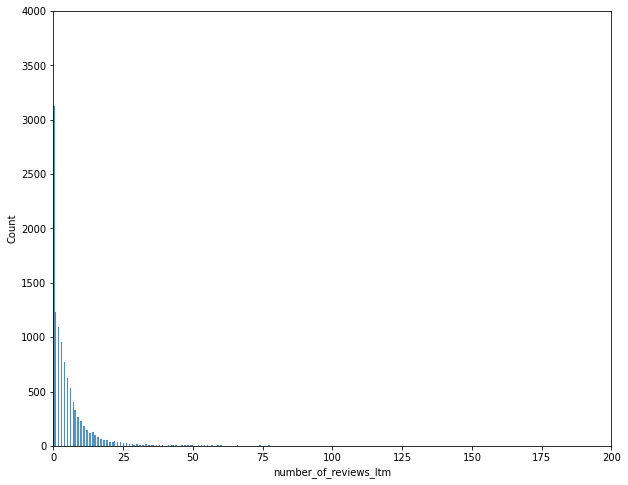

In [33]:
#histogram of number of reviews in last 12 months
sns.histplot(data = df, x = "number_of_reviews_ltm")
plt.xlim(0, 200)
plt.ylim(0, 4000)
plt.show()

In [34]:
#fraction of listings that have no reviews in the last 12 months
reviews_count.iloc[0][0]/len(df)

0.2824828085414405

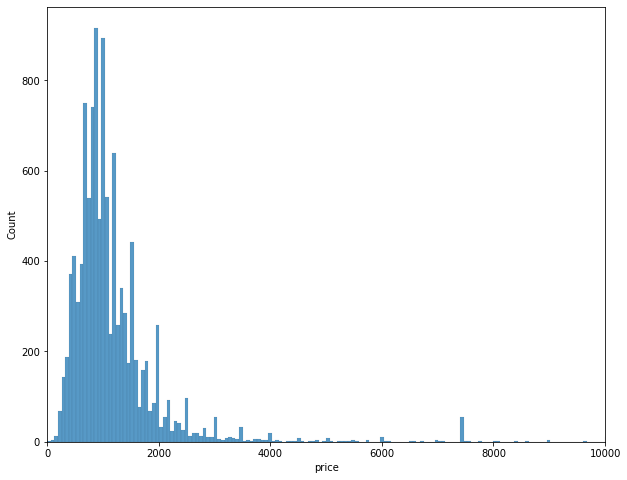

In [35]:
sns.histplot(data = df, x = 'price', bins = 1000)
plt.xlim(0, 10000)
plt.show()

In [36]:
df.groupby('price').count()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
price,,,,,,,,,,,,,,,
0,2,2,2,2,2,2,2,2,2,2,0,2,2,2,2
79,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
113,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1
120,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1
124,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36200,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1
44000,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
58000,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [37]:
df[df.price == 0]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
6633,46325896,citizenM Copenhagen Radhuspladsen,374968389,CitizenM,Indre By,55.677323,12.565638,Hotel room,0,1,0,NaN,0.0,1,0,0
7880,43078527,First Hotel Kong Frederik,316080552,First Hotel Kong Frederik,Indre By,55.677570,12.567790,Hotel room,0,1,0,NaN,0.0,1,0,0


In [38]:
#use only listings with price above 0
df = df[df.price > 0]

In [39]:
df.price.max()

64900

In [40]:
df[df.price == 64900]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
9197,11339117,“My Oasis”... a Cosy room in the Harte off Cph.,59346390,June,Amager Vest,55.66221,12.57938,Private room,64900,1,47,2021-11-08,0.6,1,0,4


In [41]:
#correlation
df.corr()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
id,1.000000,0.295479,0.014562,-0.028628,-0.002344,-0.030761,-0.243355,0.268900,-0.013652,0.229322,-0.097277
host_id,0.295479,1.000000,-0.007807,-0.005908,0.008534,-0.036255,-0.119618,0.187621,0.118274,0.158579,0.080082
latitude,0.014562,-0.007807,1.000000,-0.233909,-0.039357,0.015134,-0.034184,-0.027903,-0.037819,0.034553,-0.036137
longitude,-0.028628,-0.005908,-0.233909,1.000000,0.059978,-0.003144,0.061534,0.045760,0.058716,0.014539,0.064975
price,-0.002344,0.008534,-0.039357,0.059978,1.000000,0.060253,-0.040676,-0.051524,0.085309,0.103813,-0.032537
minimum_nights,-0.030761,-0.036255,0.015134,-0.003144,0.060253,1.000000,-0.019568,-0.062173,-0.026268,0.034543,-0.047881
number_of_reviews,-0.243355,-0.119618,-0.034184,0.061534,-0.040676,-0.019568,1.000000,0.418725,-0.046667,0.051884,0.619236
reviews_per_month,0.268900,0.187621,-0.027903,0.045760,-0.051524,-0.062173,0.418725,1.000000,-0.037860,0.159880,0.662459
calculated_host_listings_count,-0.013652,0.118274,-0.037819,0.058716,0.085309,-0.026268,-0.046667,-0.037860,1.000000,-0.039859,-0.015105
availability_365,0.229322,0.158579,0.034553,0.014539,0.103813,0.034543,0.051884,0.159880,-0.039859,1.000000,0.132092


In [42]:
#median of price
median = df.price.quantile(q=0.5)
median

995.0

In [43]:
#plot of location of listings and colored according to price(binary)
CPH = folium.Map([55.6761, 12.5689], zoom_start=12)
colormap = folium.LinearColormap(colors=['blue', 'yellow'], vmin=0, vmax=median*2)

df.apply(lambda row:folium.CircleMarker(location=[row["latitude"], 
                                                  row["longitude"]], radius = 0.1, fill=True, color = colormap(row['price']), fill_opacity=0.2).add_to(CPH),
         axis=1)
CPH.add_child(colormap)

In [44]:
#plot of location of listings and colored according to price(multiclass)
CPH = folium.Map([55.6761, 12.5689], zoom_start=12)
colormap = folium.LinearColormap(colors=['blue', 'green', 'yellow'], vmin=0, vmax=2500)

df.apply(lambda row:folium.CircleMarker(location=[row["latitude"], 
                                                  row["longitude"]], radius = 0.1, fill=True, color = colormap(row['price']), fill_opacity=0.2).add_to(CPH),
         axis=1)
CPH.add_child(colormap)

In [45]:
#df with lattitude and longitude for each neighbourhood and the median price
neighbourhood_pos = pd.DataFrame()
neighbourhood_pos['neighbourhood'] = df.neighbourhood.unique()
neighbourhood_pos['latitude'] = [55.6519, 55.661659, 55.68813, 55.6761, 55.67938, 55.65578, 55.68361, 55.7050841, 55.63872,  55.71017, 55.7105]
neighbourhood_pos['longitude'] = [12.63984, 12.516775, 12.55857, 12.5683, 12.53463, 12.54316, 12.48713, 12.5826141, 12.57218, 12.53147, 12.4782]
neighbourhood_pos['price'] = df.groupby('neighbourhood').median()['price'].values
neighbourhood_pos

,neighbourhood,latitude,longitude,price
0,Amager st,55.651900,12.639840,1000.0
1,Valby,55.661659,12.516775,872.5
2,Nrrebro,55.688130,12.558570,712.0
3,Indre By,55.676100,12.568300,800.0
4,Frederiksberg,55.679380,12.534630,1000.0
5,Vesterbro-Kongens Enghave,55.655780,12.543160,1340.0
6,Vanlse,55.683610,12.487130,900.0
7,sterbro,55.705084,12.582614,843.0
8,Amager Vest,55.638720,12.572180,800.0
9,Bispebjerg,55.710170,12.531470,1000.0


In [46]:
#plot with median price for neighbourhoods
CPH = folium.Map([55.6761, 12.5689], zoom_start=12)
colormap = folium.LinearColormap(colors=['blue', 'green', 'yellow'], vmin=neighbourhood_pos.price.min(), vmax = neighbourhood_pos.price.max())

neighbourhood_pos.apply(lambda row:folium.CircleMarker(location=[row["latitude"], 
                                                  row["longitude"]], radius = 10, fill=True, 
                                            color = colormap(row['price']), fill_opacity=0.2).add_to(CPH),
         axis=1)
CPH.add_child(colormap)

Before starting the analysis, the data was splitted into training set and test set, to make sure we don't draw any conclusion based on the test set.  

The variables `neighbourhood_group` and `license` consisted on null values alone, so these columns were deleted. The null values in `reviews_per_month` were substituted with 0. 

The neighbourhoods Nørrebro, Indre by and Vesterbro-Kongens Enghave have the highest count of listings, so there are a lot of listings in the central Copenhagen. Most listings are entire homes/apartment, some are private rooms and there are almost no listings that are shared rooms or hotel rooms. 

Some hosts have several apartments(some very close to each other so they might be the same apartments), some not in the same areas. This indicates that some hosts are a company renting out apartments. 

The `minimum_nights` is the minimum number of nights it is possible to rent the listing. Most listings have minimum nights between 1 and 5 days, which seems reasonable. However, some have a listing with a unlikely high number of minimum nights. Two listings have minimum nights at 500 and one listing even have minimum nights at 1111. A high value indicates that someone runs a business, since it it highly unlikely that it is their own home they are renting out for that many days. 

One of the most surprising finding were that 35% of the listings were not availabile in the next 365 days. 
Availability is the number of days in the next 365 days where the listing is listed as available to rent, according to [this](https://www.kaggle.com/datasets/dgomonov/new-york-city-airbnb-open-data/discussion/111835). A possible explanation is that the listings have been rented out before, but are not available in the next 365 days. As it turns out 3444 listings have reviews from the last past 12 months, so this must be the case. Another possible explanation is that some of the listings have been created right before the data was created. This can explain why there are no available days in the next 365 days. In the analysis, we saw that 414 of the listings with availability 0, don’t have any reviews. This could mean that have never been rented, and that could indicate that the listings have just been created. However, this is less than 4% of all listings, so it seems that a lot of the listings with availability 0 have been active listings previously. Therefore none of these listings are deleted, but it might make the prediction challenge more challenging since some of the prices might be set unrealistic since the listings are not available to be rented. 

Most listings cost between 0 and 2000 per night. The lowest price is 0 and the highest price is 64900. There are two listings with price 0, and these are not available in the next 365. This is an unlikely price, so these two listings are removed. The highest price seems excessively high, and the listing with this price is not available in the next 365 days. But since we don’t know which kind of rooms or apartments/houses the listings are, we have chosen not to delete any listings due to high prices. 

Prices are not very correlated with anything, which makes sense since none of these variables were expected to have a high correlation with price. Price correlates most with availability, but the correlation is only 0.10. 

There are four measures for reviews; `last_review`, `number_of_reviews`, `reviews_per_month`, `number_of_reviews_ltm`. `last_review` will not be used in the rest of the project. Reviews per month and number of reviews in the last 12 months(ltm) measures quite similar things, why it was assumed that their correlation would be high, and that only one should be used. However, this is not the case. They are quite correlated, but the correlation is only at 0.66. Therefore both variables will be used in the rest of the project. 

For the rest of the project we will use the variables `neighbourhood`, `latitude`, `longitude`, `room_type`, `price`, `minimum_nights`, `number_of_reviews`, `reviews_per_month`, `calculated_host_listings_count`, `availability_365` and `number_of_reviews_ltm`.

At the plots showing the location and prices of the listings, we have used the median of the prices as cutoff for the colors. The plots shows that most listings are in the central Copenhagen. The plots also shows that prices in the inner city are more expensive than others. This is especially clear in the first plot with only 2 colors, indicating that the binary prediction will be easier than the multiclass prediction, which off course  doesn’t come as any shock. However, it is difficult to see at the prices of the listings in the central Copenhagen, since there are a lot of points in the middle of Copenhagen. Therefore we checked the median prices for each neighbourhood, showing the opposite, namely that the central Copenhagen is the cheapest. This might be due to many listings in these neighbourhoods. The explanation might be that prices depends on areas smaller than neighbourhoods. Furthermore, we are comparing across room types, which makes it difficult to compare price. From this plot we can conclude, that location of the listings seems to have some influence on the price, but it can not be explained by the neighbourhoods, and the prediction can in no way be based only on location.

## PCA

This section serves as further analysis and a way to answer the first research question.

The dataset consists of categorical data and continuous data, which means that PCA is not very suitable. It would be better to use Factor Analysis of Mixed Data([FAMD](https://towardsdatascience.com/factor-analysis-of-mixed-data-5ad5ce98663c)), however this is out of scope of this course. So even though it might not be a good analysis of the categorical data, PCA will be performed on categorical data aswell as non-categorical data. The PCA can help us explain factors that are important for predicting prices using this data, since the PCA tells us variables that are important in explaining the variability in the data. 

In [47]:
features = ['latitude','longitude','minimum_nights','number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count','availability_365','number_of_reviews_ltm']
features_df = df[features]

In [48]:
#standardize data
mean = features_df.mean()
std = features_df.std()
standardized = (features_df-mean)/std

In [49]:
#one hot encoding for neighbourhood and room_type
need_dummies = ['neighbourhood', 'room_type']
dummies_df = pd.get_dummies(df[need_dummies], columns=need_dummies, drop_first = True)

#merge standardized with dummies_df
df_stand = pd.concat([standardized, dummies_df], axis=1, join="inner")

In [50]:
pca = decomposition.PCA()
X_pca = pca.fit(df_stand)

In [51]:
pca = decomposition.PCA()
X_pca = pca.fit(df_stand)
cumulative = np.cumsum(pca.explained_variance_ratio_)
cumulative

array([0.2471923 , 0.39286952, 0.51020863, 0.61969035, 0.72607502,
       0.81994476, 0.88356682, 0.91469314, 0.93132872, 0.94701801,
       0.9605342 , 0.97122041, 0.9802924 , 0.98781722, 0.99230194,
       0.9956798 , 0.99828472, 0.99950829, 0.99971977, 0.99987931,
       1.        ])

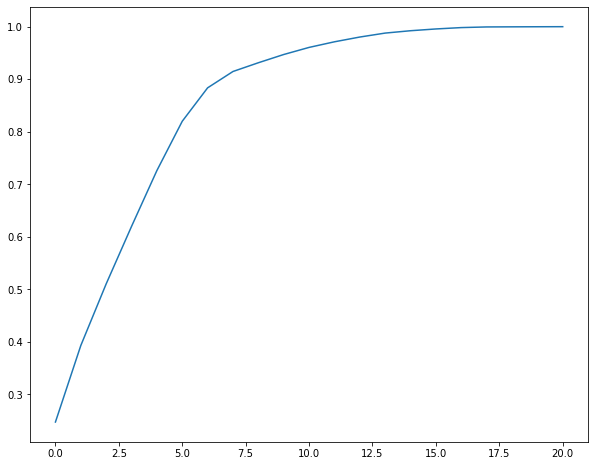

In [52]:
plt.plot(cumulative)
plt.show()

In [53]:
pca_reduced = decomposition.PCA(n_components=6)
pca_reduced.fit(df_stand)
X_reduced = pca_reduced.transform(df_stand)

In [54]:
#df with the variables for each of the 6 first principal components
PC_df =  pd.DataFrame(columns = df_stand.columns.values)

for i in range(0, 6):
  PC_df.loc[len(PC_df)] = pca_reduced.components_[i].tolist()


pc = pd.DataFrame(data = np.arange(1,7), columns = ['principal_component'])
PC_df = pd.concat([pc, PC_df], axis = 1).reindex(pc.index)
PC_df

,principal_component,latitude,longitude,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,neighbourhood_Amager st,...,neighbourhood_Frederiksberg,neighbourhood_Indre By,neighbourhood_Nrrebro,neighbourhood_Valby,neighbourhood_Vanlse,neighbourhood_Vesterbro-Kongens Enghave,neighbourhood_sterbro,room_type_Hotel room,room_type_Private room,room_type_Shared room
0,1,-0.064447,0.099268,-0.056864,0.525927,0.552364,-0.041640,0.163989,0.607246,0.014079,...,-0.013128,0.038372,-0.015413,-0.006218,-0.003024,0.003435,-0.012019,0.000908,0.036579,0.002267
1,2,-0.666810,0.644251,-0.059800,-0.029553,-0.069162,0.266044,-0.148721,-0.045205,0.112559,...,-0.041826,0.054161,-0.082101,-0.016643,-0.033675,0.052247,-0.042489,0.000541,-0.015818,-0.000816
2,3,-0.106844,0.210190,0.716152,-0.066677,-0.032707,-0.379910,0.524482,-0.062306,0.035443,...,-0.011353,0.017657,-0.020690,-0.010932,-0.011030,-0.005183,0.004452,0.000964,0.008964,0.000051
3,4,0.282403,0.074445,0.127047,-0.094475,0.033321,0.824216,0.441251,0.016680,-0.020952,...,-0.009459,0.067467,0.005859,-0.022105,-0.004166,-0.069064,0.059281,0.000939,-0.007713,0.000693
4,5,0.037285,-0.129771,0.674507,0.221251,-0.018465,0.259433,-0.630746,0.103333,-0.020738,...,0.003190,-0.010511,0.022964,0.006023,0.007106,0.016583,-0.014714,-0.001315,-0.002142,-0.000230
5,6,-0.618024,-0.665101,0.046874,-0.061343,0.053128,0.177945,0.212696,0.008537,-0.052444,...,0.059452,-0.084672,-0.067695,0.108566,0.034285,0.156548,-0.181863,-0.000028,0.024017,0.000122


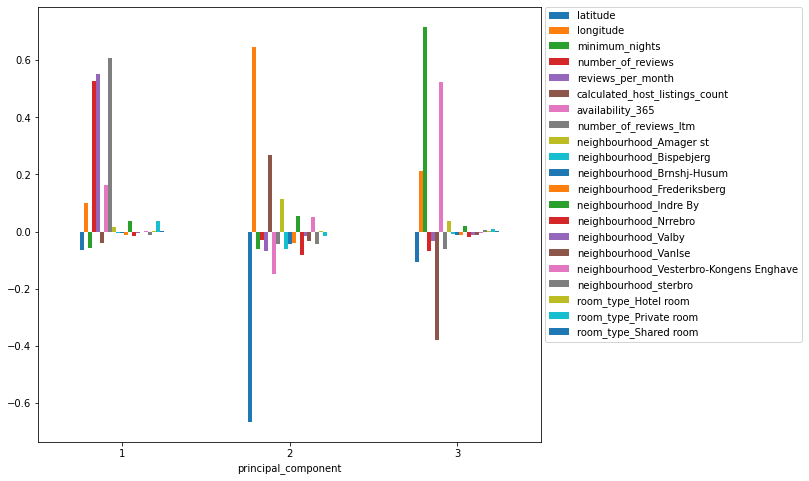

In [55]:
#plot of the first three principal compoinents
fig = PC_df[0:3].plot(x="principal_component", y = PC_df.columns[1:].values, kind="bar", rot=0)
pos = fig.get_position()
fig.set_position([pos.x0, pos.y0, pos.width * 0.9, pos.height])
fig.legend(loc='center right', bbox_to_anchor=(1.53, 0.615))
plt.show()

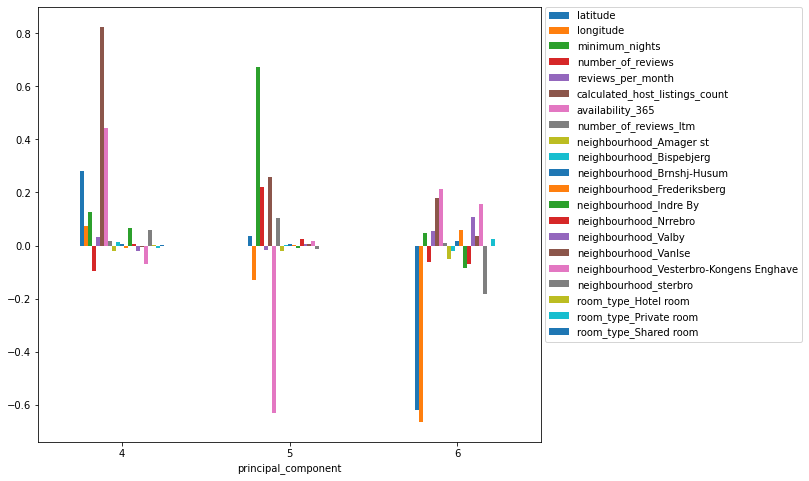

In [56]:
#principal components of the three next principal components
fig = PC_df[3:].plot(x="principal_component", y = PC_df.columns[1:].values, kind="bar", rot=0)
pos = fig.get_position()
fig.set_position([pos.x0, pos.y0, pos.width * 0.9, pos.height])
fig.legend(loc='center right', bbox_to_anchor=(1.53, 0.615))
plt.show()

The two plots above shows the contribution of the variables to the six first principal components. So it shows which variables explain most of the variability, however, it is important to be aware that the first principal components explain more than the last ones. 

Overall, we can see that the variability in the data is explained by how often a listing is rented, or maybe more how experienced the host is, since reviews and calculated host listings count are both important. The location is important, but the neighbourhoods are not that important, meaning that there are something else in the location that is important. Furthermore, the number of minimum nights and availability is also important. The importance of availability might be explained by listings with little availability might seem more exclusive, since they are rarely free. 

The PCA have shown that it is difficult to reduce the data to few dimensions, since six principal components are needed for explaining at least 80% of the variability. This means that the prediction challenge indeed can be a challenge. 

## Prediction Challenge 

For the binary prediction challenge we will use logistic regression with the standard features, logistic regression using the pricipal components and a Neural Network. 

For the multi-class calssification problem a Neural Network will be used. 

To use the same training data for each model, the dataset it split into a training, test and validation set, with the validation set not being used for the logistic regression model. The split is 64% training, 20% test and 16% validation. 

A high price is defined as a price higher than the 50th quartile in training, test and validation set respectively. The target variable is a binary variable with 0 corresponding to a low price and 1 corresponding to a high price.

### A Logistic Regression model is used to build a binary classification model 



In [57]:
#generating dataset splits 
df_train, df_val= train_test_split(df, test_size=0.2, random_state=3)
df_train = df_train.reset_index(drop = True)
df_val = df_val.reset_index(drop = True)

#Removing nan values in reviews per month 
df_train['reviews_per_month'] = df_train.reviews_per_month.fillna(0)
df_test['reviews_per_month'] = df_test.reviews_per_month.fillna(0)
df_val['reviews_per_month'] = df_val.reviews_per_month.fillna(0)

#Setting target variable 
high_threshold_train = df_train.price.quantile(q=0.5)
high_threshold_test = df_test.price.quantile(q=0.5)
high_threshold_val = df_val.price.quantile(q=0.5)
df_train['target'] = (df_train.price >= high_threshold_train).astype(int)
df_test['target'] = (df_test.price >= high_threshold_test).astype(int)
df_val['target'] = (df_val.price >= high_threshold_val).astype(int)

#Generating dummi variable 
need_dummies = ['neighbourhood', 'room_type']
feature_cols = ['id','neighbourhood','latitude','longitude','target','room_type','minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count','availability_365','number_of_reviews_ltm']
non_categircal_features =  ['latitude','longitude','minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count','availability_365','number_of_reviews_ltm']
features_train = pd.get_dummies(df_train[feature_cols], columns=need_dummies, drop_first = True)
features_test = pd.get_dummies(df_test[feature_cols], columns=need_dummies, drop_first = True)
features_val = pd.get_dummies(df_val[feature_cols], columns=need_dummies, drop_first = True)

#standardizing non categorical features
for col in non_categircal_features: 
  features_train[col] = (features_train[col]-features_train[col].mean())/features_train[col].std()
  features_test[col] = (features_test[col]-features_test[col].mean())/features_test[col].std()
  features_val[col] = (features_val[col]-features_val[col].mean())/features_val[col].std()

#defining datasets with id's included joining data later on
x_train_id = features_train.drop('target',axis = 1) 
x_test_id = features_test.drop('target',axis = 1) 
x_val_id = features_val.drop('target',axis = 1) 

#Generating datasets without id and target variable
x_train = x_train_id.drop('id',axis = 1) 
x_test = x_test_id.drop('id',axis = 1) 
x_val = x_val_id.drop('id',axis = 1) 

y_train =features_train['target']
y_test =features_test['target']
y_val =features_val['target']


In [58]:
from sklearn.metrics import confusion_matrix, recall_score, accuracy_score, precision_score

def evaluate(y_true, y_pred):
    # calculate and display confusion matrix
    labels = np.unique(y_true)
    cm = confusion_matrix(y_true, y_pred, labels=labels)
    print('Confusion matrix\n- x-axis is true labels (none, comp1, etc.)\n- y-axis is predicted labels')
    print(cm)

    # calculate precision, recall, and F1 score
    accuracy = float(np.trace(cm)) / np.sum(cm)
    precision = precision_score(y_true, y_pred, average=None, labels=labels)[1]
    recall = recall_score(y_true, y_pred, average=None, labels=labels)[1]
    f1 = 2 * precision * recall / (precision + recall)
    print("accuracy:", accuracy)
    print("precision:", precision)
    print("recall:", recall)
    print("f1 score:", f1)

In [59]:
from sklearn.linear_model import LogisticRegression
reg = LogisticRegression(max_iter=100000).fit(x_train,y_train)
y_pred = reg.predict(x_test)
evaluate(y_test,y_pred)

Confusion matrix
- x-axis is true labels (none, comp1, etc.)
- y-axis is predicted labels
[[911 469]
 [433 950]]
accuracy: 0.6735432500904813
precision: 0.6694855532064834
recall: 0.6869125090383225
f1 score: 0.6780870806566738


Feature: latitude, Score: -0.05964
Feature: longitude, Score: 0.39051
Feature: minimum_nights, Score: -0.19388
Feature: number_of_reviews, Score: -0.16567
Feature: reviews_per_month, Score: -0.10333
Feature: calculated_host_listings_count, Score: 0.13958
Feature: availability_365, Score: 0.47832
Feature: number_of_reviews_ltm, Score: 0.03117
Feature: neighbourhood_Amager st, Score: -0.85725
Feature: neighbourhood_Bispebjerg, Score: -0.47137
Feature: neighbourhood_Brnshj-Husum, Score: 0.77040
Feature: neighbourhood_Frederiksberg, Score: 0.72288
Feature: neighbourhood_Indre By, Score: 1.12804
Feature: neighbourhood_Nrrebro, Score: -0.03131
Feature: neighbourhood_Valby, Score: 0.42425
Feature: neighbourhood_Vanlse, Score: 0.45956
Feature: neighbourhood_Vesterbro-Kongens Enghave, Score: 0.46584
Feature: neighbourhood_sterbro, Score: 0.08477
Feature: room_type_Hotel room, Score: -0.45946
Feature: room_type_Private room, Score: -2.62537
Feature: room_type_Shared room, Score: -1.73078


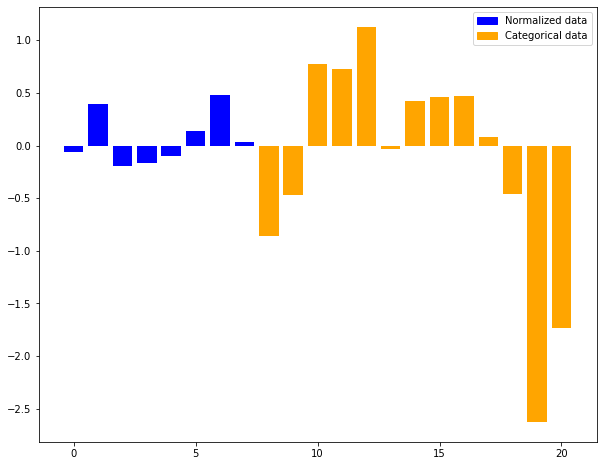

In [60]:
#Importance of features
import matplotlib.patches as mpatches
importance = reg.coef_[0]
for i,v in enumerate(importance):
	print('Feature: %s, Score: %.5f' % (x_train.columns[i],v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance, color = ['blue','blue','blue','blue','blue','blue','blue','blue','orange','orange','orange','orange','orange','orange','orange','orange','orange','orange','orange','orange','orange',])
blue = mpatches.Patch(color='blue', label='Normalized data')
orange = mpatches.Patch(color='orange', label='Categorical data')
plt.legend(handles=[blue,orange])
plt.show()

### Logistic regression using PCA 
The same logistic regression is performed, where PCA is carried out beforehand.
The six first components are chosen, as they explain more than 80% of the data.

In [61]:
pca = decomposition.PCA() 
pca.fit(x_train)
cummulative = np.cumsum(pca.explained_variance_ratio_) 
cummulative

array([0.24956864, 0.39478187, 0.51266947, 0.6226392 , 0.72857342,
       0.82243723, 0.88407001, 0.91455952, 0.93123535, 0.94690194,
       0.96042373, 0.97124847, 0.98042041, 0.98795917, 0.99239683,
       0.99572973, 0.99827382, 0.9994895 , 0.99970074, 0.99986192,
       1.        ])

In [62]:
pca = decomposition.PCA(n_components = 6) 
pca.fit(x_train)
x_train_pca = pca.fit_transform(x_train)
x_train_pca = pd.DataFrame(x_train_pca)
x_test_pca = pca.fit_transform(x_test)
x_test_pca = pd.DataFrame(x_test_pca)

In [63]:
reg = LogisticRegression(max_iter=100000).fit(x_train_pca,y_train)
y_pred = reg.predict(x_test_pca)
evaluate(y_test,y_pred)

Confusion matrix
- x-axis is true labels (none, comp1, etc.)
- y-axis is predicted labels
[[955 425]
 [632 751]]
accuracy: 0.6174448063698879
precision: 0.6386054421768708
recall: 0.5430224150397687
f1 score: 0.58694802657288


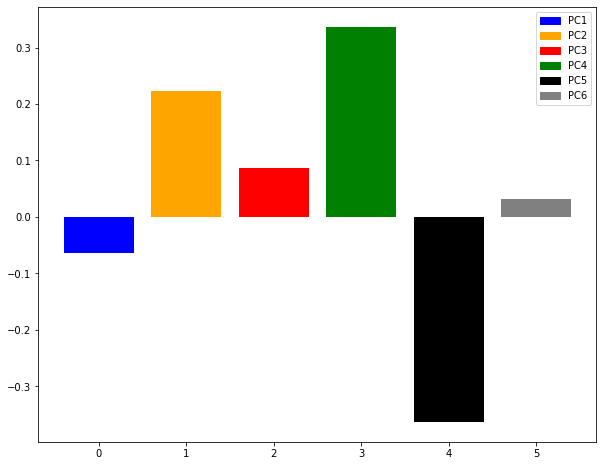

In [64]:
importance = reg.coef_[0]
plt.bar([x for x in range(len(importance))], importance,color = ['blue','orange','red','green','black','grey'])
one = mpatches.Patch(color='blue', label='PC1')
two = mpatches.Patch(color='orange', label='PC2')
three = mpatches.Patch(color='red', label='PC3')
four = mpatches.Patch(color='green', label='PC4')
five = mpatches.Patch(color='black', label='PC5')
six = mpatches.Patch(color='grey', label='PC6')
plt.legend(handles=[one,two,three,four,five,six])
plt.show()

### Creating a NN for binary prediction
A NN is created to predict a low or high price. 

In [65]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

In [66]:
x_val.shape

(2210, 21)

Epoch 1/100
89/89 [==============================] - 2s 8ms/step - loss: 0.6408 - accuracy: 0.6283 - val_loss: 0.5996 - val_accuracy: 0.6683
Epoch 2/100
89/89 [==============================] - 0s 5ms/step - loss: 0.5935 - accuracy: 0.6669 - val_loss: 0.5803 - val_accuracy: 0.6851
Epoch 3/100
89/89 [==============================] - 0s 5ms/step - loss: 0.5845 - accuracy: 0.6760 - val_loss: 0.5772 - val_accuracy: 0.6819
Epoch 4/100
89/89 [==============================] - 0s 4ms/step - loss: 0.5794 - accuracy: 0.6798 - val_loss: 0.5763 - val_accuracy: 0.6882
Epoch 5/100
89/89 [==============================] - 0s 5ms/step - loss: 0.5771 - accuracy: 0.6862 - val_loss: 0.5742 - val_accuracy: 0.6878
Epoch 6/100
89/89 [==============================] - 0s 5ms/step - loss: 0.5780 - accuracy: 0.6775 - val_loss: 0.5722 - val_accuracy: 0.6919
Epoch 7/100
89/89 [==============================] - 0s 5ms/step - loss: 0.5766 - accuracy: 0.6831 - val_loss: 0.5718 - val_accuracy: 0.6941
Epoch 8/100
8

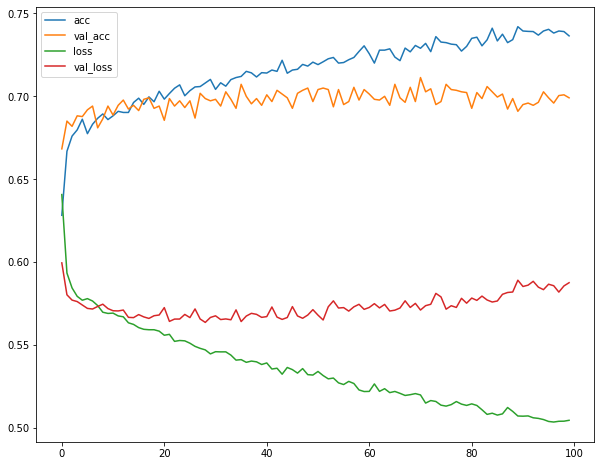

In [67]:
model = Sequential() 
model.add(Dense(200,input_dim = 21, activation = 'relu'))
model.add(Dropout(rate=0.25))
model.add(Dense(50,input_dim = 200, activation = 'relu'))
model.add(Dense(1,activation = 'sigmoid'))
model.compile(loss='binary_crossentropy', optimizer = 'adam', metrics = ['accuracy'])
model.fit(x_train, y_train, epochs= 100, batch_size = 100, validation_data = (x_val,y_val));
history = model.history
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(acc)
plt.plot(val_acc)
plt.plot(loss)
plt.plot(val_loss)
plt.legend(['acc','val_acc','loss','val_loss'])
plt.show()

Looking at the validation loss and accuracy it is evident that the model is overfitting after around 30 epochs. Therefore we run the same model, with just 30 epochs to prevent this. 

Epoch 1/30
89/89 [==============================] - 1s 7ms/step - loss: 0.6417 - accuracy: 0.6340 - val_loss: 0.6029 - val_accuracy: 0.6688
Epoch 2/30
89/89 [==============================] - 0s 5ms/step - loss: 0.5972 - accuracy: 0.6669 - val_loss: 0.5844 - val_accuracy: 0.6855
Epoch 3/30
89/89 [==============================] - 0s 5ms/step - loss: 0.5869 - accuracy: 0.6723 - val_loss: 0.5791 - val_accuracy: 0.6824
Epoch 4/30
89/89 [==============================] - 0s 5ms/step - loss: 0.5809 - accuracy: 0.6800 - val_loss: 0.5791 - val_accuracy: 0.6774
Epoch 5/30
89/89 [==============================] - 0s 5ms/step - loss: 0.5789 - accuracy: 0.6804 - val_loss: 0.5768 - val_accuracy: 0.6891
Epoch 6/30
89/89 [==============================] - 0s 5ms/step - loss: 0.5753 - accuracy: 0.6848 - val_loss: 0.5749 - val_accuracy: 0.6869
Epoch 7/30
89/89 [==============================] - 0s 5ms/step - loss: 0.5742 - accuracy: 0.6839 - val_loss: 0.5753 - val_accuracy: 0.6923
Epoch 8/30
89/89 [==

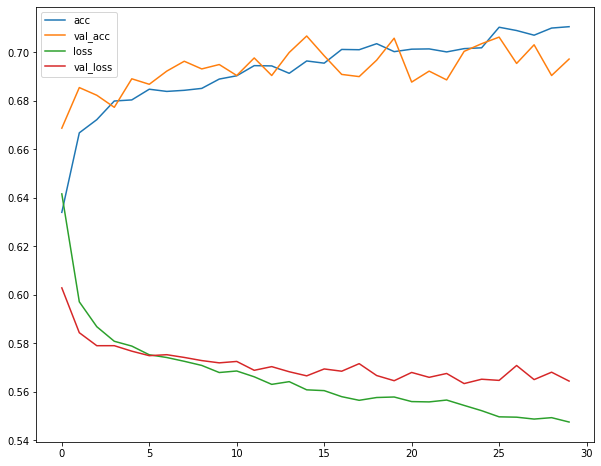

In [68]:
model = Sequential() 
model.add(Dense(200,input_dim = 21, activation = 'relu'))
model.add(Dropout(rate=0.25))
model.add(Dense(50,input_dim = 200, activation = 'relu'))
model.add(Dense(1,activation = 'sigmoid'))
model.compile(loss='binary_crossentropy', optimizer = 'adam', metrics = ['accuracy'])
model.fit(x_train, y_train, epochs= 30, batch_size = 100, validation_data = (x_val,y_val));
history = model.history
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(acc)
plt.plot(val_acc)
plt.plot(loss)
plt.plot(val_loss)
plt.legend(['acc','val_acc','loss','val_loss'])
plt.show()

In [69]:
y_pred = model.predict(x_test)
y_pred = (y_pred > 0.5).astype(int)
evaluate(y_test, y_pred)

87/87 [==============================] - 0s 1ms/step
Confusion matrix
- x-axis is true labels (none, comp1, etc.)
- y-axis is predicted labels
[[919 461]
 [391 992]]
accuracy: 0.6916395222584147
precision: 0.6827253957329663
recall: 0.7172812725958062
f1 score: 0.6995768688293371


### Multi-class Classification model using a Neural Network

To classify the three classes a Neural Network will be used. 

The 33rd and the 66th quartile will be used as the threshold for a low, medium and high price respectively. 

Because the classes are mutually exclusive, a softmax activation function is applied to the last layer. Using this method the predicted class becomes the class with the highest value.

In [70]:
#Generating target variable for training 
med_threshold_train = df_train.price.quantile(q=0.33)
high_threshold_train = df_train.price.quantile(q=0.66)
med_threshold_test = df_test.price.quantile(q=0.33)
high_threshold_test = df_test.price.quantile(q=0.66)
med_threshold_val = df_val.price.quantile(q=0.33)
high_threshold_val = df_val.price.quantile(q=0.66)

#generating target dummi variable for each dataset 
df_train['target'] = 0
for i in range(np.size(df_train.price)): 
  if (df_train.price[i] >= high_threshold_train): 
    df_train['target'][i] = 'high'
  elif (df_train.price[i] >= med_threshold_train): 
    df_train['target'][i] = 'med'
  else: 
    df_train['target'][i] = 'low'
target_train = pd.get_dummies(df_train['target']) 
target_train = np.matrix(target_train.reset_index(drop=True))

df_test['target'] = 0
for i in range(np.size(df_test.price)): 
  if (df_test.price[i] >= high_threshold_test): 
    df_test['target'][i] = 'high'
  elif (df_test.price[i] >= med_threshold_test): 
    df_test['target'][i] = 'med'
  else: 
    df_test['target'][i] = 'low'
target_test = pd.get_dummies(df_test['target']) 
target_test = np.matrix(target_test.reset_index(drop=True))

df_val['target'] = 0
for i in range(np.size(df_val.price)): 
  if (df_val.price[i] >= high_threshold_val): 
    df_val['target'][i] = 'high'
  elif (df_val.price[i] >= med_threshold_val): 
    df_val['target'][i] = 'med'
  else: 
    df_val['target'][i] = 'low'
target_val = pd.get_dummies(df_val['target']) 
target_val = np.matrix(target_val.reset_index(drop=True))

#Generating dummy variable 
need_dummies = ['neighbourhood', 'room_type']
feature_cols = ['id','neighbourhood','latitude','longitude','target','room_type','minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count','availability_365','number_of_reviews_ltm']
non_categircal_features =  ['latitude','longitude','minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count','availability_365','number_of_reviews_ltm']
features_train = pd.get_dummies(df_train[feature_cols], columns=need_dummies, drop_first = True)
features_test = pd.get_dummies(df_test[feature_cols], columns=need_dummies, drop_first = True)
features_val = pd.get_dummies(df_val[feature_cols], columns=need_dummies, drop_first = True)

#standardizing non categorical features
for col in non_categircal_features: 
  features_train[col] = (features_train[col]-features_train[col].mean())/features_train[col].std()
  features_test[col] = (features_test[col]-features_test[col].mean())/features_test[col].std()
  features_val[col] = (features_val[col]-features_val[col].mean())/features_val[col].std()

#defining datasets with id's included joining data later on
x_train_id = features_train.drop('target',axis = 1) 
x_test_id = features_test.drop('target',axis = 1) 
x_val_id = features_val.drop('target',axis = 1) 

#Generating datasets without id and target variable
x_train = x_train_id.drop('id',axis = 1) 
x_test = x_test_id.drop('id',axis = 1) 
x_val = x_val_id.drop('id',axis = 1) 

y_train =target_train
y_test =target_test 
y_val =target_val


<ipython-input-70-a655c5bd2b41>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['target'][i] = 'high'
/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
<ipython-input-70-a655c5bd2b41>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test['target'][i] = 'high'
<ipython-input-70-a655c5bd2b41>:35: SettingWithCop

Epoch 1/100
89/89 [==============================] - 1s 10ms/step - loss: 1.0028 - accuracy: 0.4850 - val_loss: 0.9358 - val_accuracy: 0.5403
Epoch 2/100
89/89 [==============================] - 1s 8ms/step - loss: 0.9462 - accuracy: 0.5201 - val_loss: 0.9245 - val_accuracy: 0.5321
Epoch 3/100
89/89 [==============================] - 1s 8ms/step - loss: 0.9333 - accuracy: 0.5329 - val_loss: 0.9228 - val_accuracy: 0.5357
Epoch 4/100
89/89 [==============================] - 1s 8ms/step - loss: 0.9283 - accuracy: 0.5271 - val_loss: 0.9203 - val_accuracy: 0.5294
Epoch 5/100
89/89 [==============================] - 1s 8ms/step - loss: 0.9236 - accuracy: 0.5322 - val_loss: 0.9193 - val_accuracy: 0.5362
Epoch 6/100
89/89 [==============================] - 1s 10ms/step - loss: 0.9188 - accuracy: 0.5340 - val_loss: 0.9207 - val_accuracy: 0.5326
Epoch 7/100
89/89 [==============================] - 1s 14ms/step - loss: 0.9200 - accuracy: 0.5346 - val_loss: 0.9185 - val_accuracy: 0.5353
Epoch 8/10

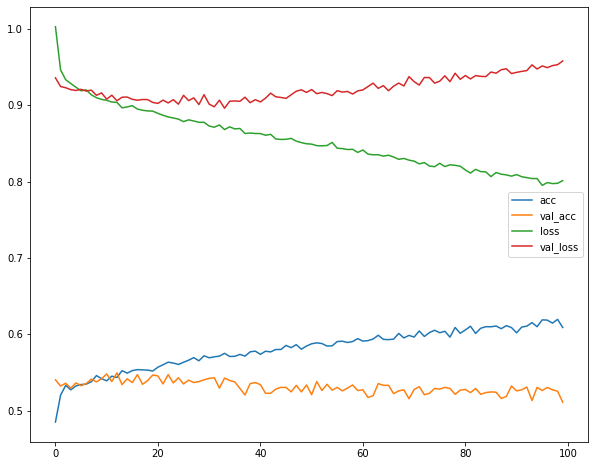

In [71]:
model = Sequential() 
model.add(Dense(250,input_dim = 21, activation = 'relu'))
model.add(Dropout(rate=0.3))
model.add(Dense(200,input_dim = 250, activation = 'relu'))
model.add(Dropout(rate=0.3))
model.add(Dense(50,input_dim = 200, activation = 'relu'))
#Softmax is used due to the categories being mutually exclusive
model.add(Dense(3,activation = 'softmax'))


#CategoricalCrossentropy as opposed to the binary_crossentropy used in the former model
model.compile(loss='CategoricalCrossentropy', optimizer = 'adam', metrics = ['accuracy'])
model.fit(x_train, y_train, epochs= 100, batch_size = 100, validation_data = (x_val,y_val));
history = model.history
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(acc)
plt.plot(val_acc)
plt.plot(loss)
plt.plot(val_loss)
plt.legend(['acc','val_acc','loss','val_loss'])
plt.show()

Looking at the loss we see that the validation accuracy and loss starts to get worse after approximately 25 epochs. Therefore a new model is trained that is only trained for 25 epochs. 

Epoch 1/25
89/89 [==============================] - 1s 10ms/step - loss: 1.0150 - accuracy: 0.4770 - val_loss: 0.9370 - val_accuracy: 0.5217
Epoch 2/25
89/89 [==============================] - 1s 8ms/step - loss: 0.9493 - accuracy: 0.5166 - val_loss: 0.9351 - val_accuracy: 0.5290
Epoch 3/25
89/89 [==============================] - 1s 7ms/step - loss: 0.9367 - accuracy: 0.5310 - val_loss: 0.9220 - val_accuracy: 0.5389
Epoch 4/25
89/89 [==============================] - 1s 7ms/step - loss: 0.9260 - accuracy: 0.5319 - val_loss: 0.9273 - val_accuracy: 0.5285
Epoch 5/25
89/89 [==============================] - 1s 8ms/step - loss: 0.9255 - accuracy: 0.5335 - val_loss: 0.9199 - val_accuracy: 0.5299
Epoch 6/25
89/89 [==============================] - 1s 7ms/step - loss: 0.9212 - accuracy: 0.5362 - val_loss: 0.9220 - val_accuracy: 0.5407
Epoch 7/25
89/89 [==============================] - 1s 7ms/step - loss: 0.9173 - accuracy: 0.5363 - val_loss: 0.9193 - val_accuracy: 0.5330
Epoch 8/25
89/89 [=

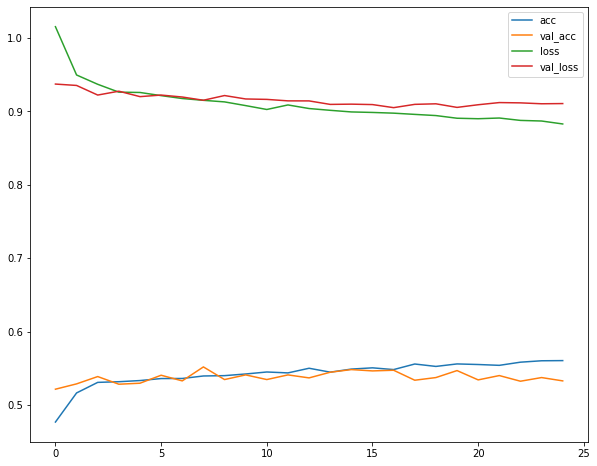

In [72]:
model = Sequential() 
model.add(Dense(250,input_dim = 21, activation = 'relu'))
model.add(Dropout(rate=0.3))
model.add(Dense(200,input_dim = 250, activation = 'relu'))
model.add(Dropout(rate=0.3))
model.add(Dense(50,input_dim = 200, activation = 'relu'))
#Softmax is used due to the categories being mutually exclusive
model.add(Dense(3,activation = 'softmax'))

#CategoricalCrossentropy as opposed to the binary_crossentropy used in the former model
model.compile(loss='CategoricalCrossentropy', optimizer = 'adam', metrics = ['accuracy'])
model.fit(x_train, y_train, epochs= 25, batch_size = 100, validation_data = (x_val,y_val));
history = model.history
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(acc)
plt.plot(val_acc)
plt.plot(loss)
plt.plot(val_loss)
plt.legend(['acc','val_acc','loss','val_loss'])
plt.show()

In [73]:
y_pred = model.predict(x_test)
y_pred = np.argmax(y_pred,axis = 1)

87/87 [==============================] - 0s 2ms/step


In [74]:
#For this multiclass classifier we cannot use the evaluate function and we therefore import modules from sklearn
from sklearn.metrics import f1_score ,accuracy_score , classification_report
print(classification_report(np.array(np.argmax(y_test,axis=1).reshape(-1))[0], y_pred))


              precision    recall  f1-score   support

           0       0.54      0.69      0.61       942
           1       0.65      0.57      0.61       874
           2       0.44      0.37      0.40       947

    accuracy                           0.54      2763
   macro avg       0.54      0.54      0.54      2763
weighted avg       0.54      0.54      0.54      2763



**Logistic regression** 

The logistic regression model obtained an f1 score of 0.68. It is worth noting the the regression coefficients of the standardized data can be compared directly, and the same for categorical, but coefficients between the two cannot be directly compared because the features have a different scale. Longitude and availability are the most important features of the standardized data. While private_room has the largest coefficient of the catagorical data. 


**Logistic regression with PCA** 

The logistic regression performed with the first 6 principal components had a f1 score of 0.59, significantly worse than the one using the normal features. 


**Neural Network** 

The neural network had a f1 score of 0.70. A bit better than the Logistic regression. 

**Neural Network for multi-class classification** 

For the multi-class classification the Neural Network obtained f1 scores of 0.60, 0.58 and 0.41 for each class respectively, with a weighted f1 score of 0.53.


# Exploratory Component
### Using distance to nearest metrostop as a feature 

The coefficients from the logistic regression revealed that the longitude had a large importance in terms of the model. This led us to think that there was more to the location of the airbnb, and that maybe the distance to the nearest metro station could be a feature correlating with the price of an airbnb. To investigate this all metro coordinates were loaded from google maps, and the distance between the listing and each metro stop was computed. The distance is calculated using the haversine formula: https://en.wikipedia.org/wiki/Haversine_formula

In [75]:
#Generating target variable again for binary prediction
df_train, df_val= train_test_split(df, test_size=0.2, random_state=3)
df_train = df_train.reset_index(drop = True)
df_val = df_val.reset_index(drop = True)

#Removing nan values in reviews per month 
df_train['reviews_per_month'] = df_train.reviews_per_month.fillna(0)
df_test['reviews_per_month'] = df_test.reviews_per_month.fillna(0)
df_val['reviews_per_month'] = df_val.reviews_per_month.fillna(0)

#Setting target variable 
high_threshold_train = df_train.price.quantile(q=0.5)
high_threshold_test = df_test.price.quantile(q=0.5)
high_threshold_val = df_val.price.quantile(q=0.5)
df_train['target'] = (df_train.price >= high_threshold_train).astype(int)
df_test['target'] = (df_test.price >= high_threshold_test).astype(int)
df_val['target'] = (df_val.price >= high_threshold_val).astype(int)

#Generating dummi variable 
need_dummies = ['neighbourhood', 'room_type']
feature_cols = ['id','neighbourhood','latitude','longitude','target','room_type','minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count','availability_365','number_of_reviews_ltm']
non_categircal_features =  ['latitude','longitude','minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count','availability_365','number_of_reviews_ltm']
features_train = pd.get_dummies(df_train[feature_cols], columns=need_dummies, drop_first = True)
features_test = pd.get_dummies(df_test[feature_cols], columns=need_dummies, drop_first = True)
features_val = pd.get_dummies(df_val[feature_cols], columns=need_dummies, drop_first = True)

#standardizing non categorical features
for col in non_categircal_features: 
  features_train[col] = (features_train[col]-features_train[col].mean())/features_train[col].std()
  features_test[col] = (features_test[col]-features_test[col].mean())/features_test[col].std()
  features_val[col] = (features_val[col]-features_val[col].mean())/features_val[col].std()

#defining datasets with id's included joining data later on
x_train_id = features_train.drop('target',axis = 1) 
x_test_id = features_test.drop('target',axis = 1) 
x_val_id = features_val.drop('target',axis = 1) 

#Generating datasets without id and target variable
x_train = x_train_id.drop('id',axis = 1) 
x_test = x_test_id.drop('id',axis = 1) 
x_val = x_val_id.drop('id',axis = 1) 

y_train =features_train['target']
y_test =features_test['target']
y_val =features_val['target']


In [76]:
def haversine(lat1, lon1, lat2, lon2):
    lon1, lat1, lon2, lat2 = np.radians(lon1), np.radians(lat1), np.radians(lon2), np.radians(lat2)
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a)) 
    r = 6371.
    return c * r * 1000

In [77]:
# to get the id part of the file
link = 'https://drive.google.com/file/d/1aGWQVOh7MTgcc4inEHoEgqYTGWHyGEyq/view'
id = link.split("/")[-2]
downloaded = drive.CreateFile({'id':id})
downloaded.GetContentFile('metro-stops.csv') 
metro_stops = pd.read_csv('metro-stops.csv')
#removing leading and trailing space in column name 
metro_stops = pd.DataFrame({'Latitude':metro_stops['Latitude'],'Longitude':metro_stops[' Longitude '] })


In [78]:
CPH = folium.Map([55.6761, 12.5689], zoom_start=12)
for i in range(len(metro_stops)): 
  folium.CircleMarker(location = [metro_stops.Latitude[i], metro_stops.Longitude[i]]).add_to(CPH)
CPH

In [79]:
#Adding the non standardized latitude and longitude from the original dataset. 
x_train = x_train_id.join(df_orig[['id','latitude','longitude']].set_index('id'), on = 'id', how ='inner',lsuffix ='L').drop(['id','latitudeL','longitudeL'],axis=1).reset_index(drop=True)
x_test = x_test_id.join(df_orig[['id','latitude','longitude']].set_index('id'), on = 'id', how ='inner',lsuffix ='L').drop(['id','latitudeL','longitudeL'],axis=1).reset_index(drop=True)
x_val = x_val_id.join(df_orig[['id','latitude','longitude']].set_index('id'), on = 'id', how ='inner',lsuffix ='L').drop(['id','latitudeL','longitudeL'],axis=1).reset_index(drop=True)

In [80]:
#Calculating the distance to the nearest metro stop for each aribnb in kilometers. 
x_train['metro_dist']=999999
x_val['metro_dist']=999999
x_test['metro_dist']=999999
for i in range(x_train['latitude'].size):
  for j in range(metro_stops['Latitude'].size):
    if haversine(x_train['latitude'][i],x_train['longitude'][i], metro_stops['Latitude'][j], metro_stops['Longitude'][j]) < x_train['metro_dist'][i]:
      x_train['metro_dist'][i] = haversine(x_train['latitude'][i],x_train['longitude'][i], metro_stops['Latitude'][j], metro_stops['Longitude'][j])
for i in range(x_test['latitude'].size):
  for j in range(metro_stops['Latitude'].size):
    if haversine(x_test['latitude'][i],x_test['longitude'][i], metro_stops['Latitude'][j], metro_stops['Longitude'][j]) < x_test['metro_dist'][i]:
      x_test['metro_dist'][i] = haversine(x_test['latitude'][i],x_test['longitude'][i], metro_stops['Latitude'][j], metro_stops['Longitude'][j])
for i in range(x_val['latitude'].size):
  for j in range(metro_stops['Latitude'].size):
    if haversine(x_val['latitude'][i],x_val['longitude'][i], metro_stops['Latitude'][j], metro_stops['Longitude'][j]) < x_val['metro_dist'][i]:
      x_val['metro_dist'][i] = haversine(x_train['latitude'][i],x_val['longitude'][i], metro_stops['Latitude'][j], metro_stops['Longitude'][j])

<ipython-input-80-2283b401dd35>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train['metro_dist'][i] = haversine(x_train['latitude'][i],x_train['longitude'][i], metro_stops['Latitude'][j], metro_stops['Longitude'][j])
<ipython-input-80-2283b401dd35>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_test['metro_dist'][i] = haversine(x_test['latitude'][i],x_test['longitude'][i], metro_stops['Latitude'][j], metro_stops['Longitude'][j])
<ipython-input-80-2283b401dd35>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.p

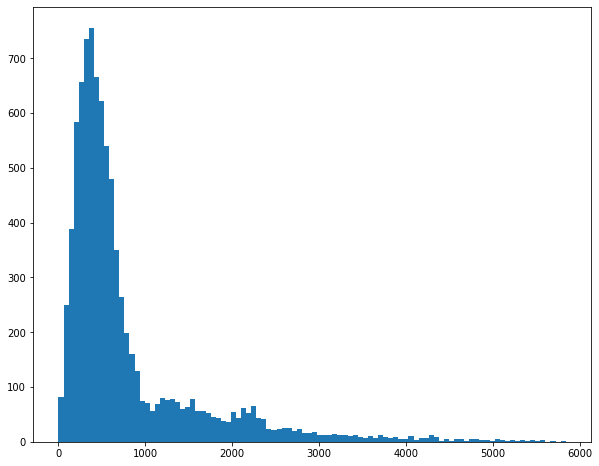

In [81]:
plt.hist(x_train.metro_dist,bins=100);

The distribution of distance to metro stops show that most appartments are located less than 1 kilometer from a metro stop, which is not ideal for a descriptor, since there is little variation.

In [82]:
#Finding the minimum and maximum distance to metro
print('Min dist: '+str(x_train.metro_dist.min()),'Max dist: '+str(x_train.metro_dist.max()))

Min dist: 5 Max dist: 5835


In [83]:
#Standardizing the latitude and longitude, and the metro distance
x_train['latitude'] = (x_train.latitude- x_train.latitude.mean())/x_train.latitude.std()
x_train['longitude'] = (x_train.longitude- x_train.longitude.mean())/x_train.longitude.std()
x_test['latitude'] = (x_test.latitude- x_test.latitude.mean())/x_test.latitude.std()
x_test['longitude'] = (x_test.longitude- x_test.longitude.mean())/x_test.longitude.std()
x_val['latitude'] = (x_val.latitude- x_val.latitude.mean())/x_val.latitude.std()
x_val['longitude'] = (x_val.longitude- x_val.longitude.mean())/x_val.longitude.std()
x_train['metro_dist'] = (x_train.metro_dist-x_train.metro_dist.mean())/x_train.metro_dist.std()
x_test['metro_dist'] = (x_test.metro_dist-x_test.metro_dist.mean())/x_test.metro_dist.std()
x_val['metro_dist'] = (x_val.metro_dist-x_val.metro_dist.mean())/x_val.metro_dist.std()


In [84]:
#The logistic regression is carried out again.
reg = LogisticRegression(max_iter=100000).fit(x_train,y_train)
y_pred = reg.predict(x_test)
evaluate(y_test,y_pred)

Confusion matrix
- x-axis is true labels (none, comp1, etc.)
- y-axis is predicted labels
[[922 458]
 [436 947]]
accuracy: 0.6764386536373507
precision: 0.6740213523131673
recall: 0.6847433116413594
f1 score: 0.6793400286944046


Feature: minimum_nights, Score: -0.19469
Feature: number_of_reviews, Score: -0.16446
Feature: reviews_per_month, Score: -0.10296
Feature: calculated_host_listings_count, Score: 0.13919
Feature: availability_365, Score: 0.47638
Feature: number_of_reviews_ltm, Score: 0.03189
Feature: neighbourhood_Amager st, Score: -0.88193
Feature: neighbourhood_Bispebjerg, Score: -0.52624
Feature: neighbourhood_Brnshj-Husum, Score: 0.66484
Feature: neighbourhood_Frederiksberg, Score: 0.79536
Feature: neighbourhood_Indre By, Score: 1.14941
Feature: neighbourhood_Nrrebro, Score: 0.01406
Feature: neighbourhood_Valby, Score: 0.33998
Feature: neighbourhood_Vanlse, Score: 0.51908
Feature: neighbourhood_Vesterbro-Kongens Enghave, Score: 0.49240
Feature: neighbourhood_sterbro, Score: 0.07358
Feature: room_type_Hotel room, Score: -0.45431
Feature: room_type_Private room, Score: -2.63175
Feature: room_type_Shared room, Score: -1.73207
Feature: latitude, Score: -0.05305
Feature: longitude, Score: 0.42797
Feature:

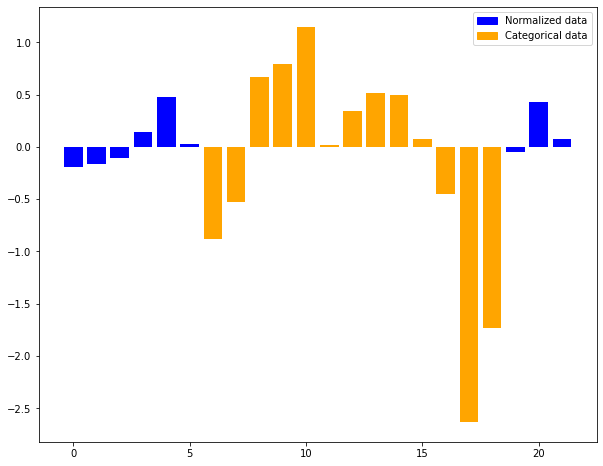

In [85]:
#Printing coefficients
importance = reg.coef_[0]
for i,v in enumerate(importance):
	print('Feature: %s, Score: %.5f' % (x_train.columns[i],v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance,color = ['blue','blue','blue','blue','blue','blue','orange','orange','orange','orange','orange','orange','orange','orange','orange','orange','orange','orange','orange','blue','blue','blue'])
blue = mpatches.Patch(color='blue', label='Normalized data')
orange = mpatches.Patch(color='orange', label='Categorical data')
plt.legend(handles=[blue,orange])
plt.show()

As seen, the distance to the nearest metrostop is not important relative to other features. The regression coefficients can directly be compared since the data was standardized before fitting the model.  

A very similar concept is the distance to the center of the city, with coordinates 55.67618459419948, 12.568618380840231, which often is shown to users of airbnb. Therefore, this feature will be investigated in the same way as the distance to the nearest metro stop. 

#### Using the distance to city center as an engineered feature



In [86]:
x_train = x_train_id.join(df_orig[['id','latitude','longitude']].set_index('id'), on = 'id', how ='inner',lsuffix ='L').drop(['id','latitudeL','longitudeL'],axis=1).reset_index(drop=True)
x_test = x_test_id.join(df_orig[['id','latitude','longitude']].set_index('id'), on = 'id', how ='inner',lsuffix ='L').drop(['id','latitudeL','longitudeL'],axis=1).reset_index(drop=True)
x_val = x_val_id.join(df_orig[['id','latitude','longitude']].set_index('id'), on = 'id', how ='inner',lsuffix ='L').drop(['id','latitudeL','longitudeL'],axis=1).reset_index(drop=True)
x_train['center_dist']=999999
x_val['center_dist']=999999
x_test['center_dist']=999999

#coordinates of Copenhagen center 
Latitude = 55.67618459419948  
Longitude = 12.568618380840231

for i in range(x_train['latitude'].size):
  x_train['center_dist'][i] = haversine(x_train['latitude'][i],x_train['longitude'][i], Latitude, Longitude)
for i in range(x_test['latitude'].size):
  x_test['center_dist'][i] = haversine(x_test['latitude'][i],x_test['longitude'][i], Latitude, Longitude)
for i in range(x_val['latitude'].size):
  x_val['center_dist'][i] = haversine(x_train['latitude'][i],x_val['longitude'][i], Latitude, Longitude)

x_train['metro_dist']=999999
x_val['metro_dist']=999999
x_test['metro_dist']=999999
for i in range(x_train['latitude'].size):
  for j in range(metro_stops['Latitude'].size):
    if haversine(x_train['latitude'][i],x_train['longitude'][i], metro_stops['Latitude'][j], metro_stops['Longitude'][j]) < x_train['metro_dist'][i]:
      x_train['metro_dist'][i] = haversine(x_train['latitude'][i],x_train['longitude'][i], metro_stops['Latitude'][j], metro_stops['Longitude'][j])
for i in range(x_test['latitude'].size):
  for j in range(metro_stops['Latitude'].size):
    if haversine(x_test['latitude'][i],x_test['longitude'][i], metro_stops['Latitude'][j], metro_stops['Longitude'][j]) < x_test['metro_dist'][i]:
      x_test['metro_dist'][i] = haversine(x_test['latitude'][i],x_test['longitude'][i], metro_stops['Latitude'][j], metro_stops['Longitude'][j])
for i in range(x_val['latitude'].size):
  for j in range(metro_stops['Latitude'].size):
    if haversine(x_val['latitude'][i],x_val['longitude'][i], metro_stops['Latitude'][j], metro_stops['Longitude'][j]) < x_val['metro_dist'][i]:
      x_val['metro_dist'][i] = haversine(x_train['latitude'][i],x_val['longitude'][i], metro_stops['Latitude'][j], metro_stops['Longitude'][j])
std_metro_dist = np.std(x_train.metro_dist)
std_center_dist = np.std(x_train.center_dist)



<ipython-input-86-3482c9303eb3>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_train['center_dist'][i] = haversine(x_train['latitude'][i],x_train['longitude'][i], Latitude, Longitude)
<ipython-input-86-3482c9303eb3>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_test['center_dist'][i] = haversine(x_test['latitude'][i],x_test['longitude'][i], Latitude, Longitude)
<ipython-input-86-3482c9303eb3>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-vie

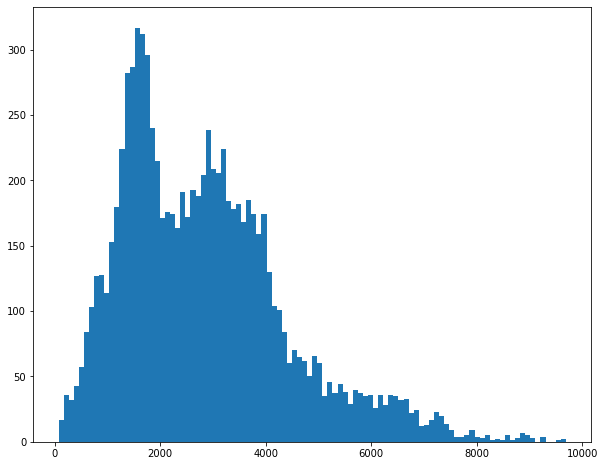

In [87]:
plt.hist(x_train.center_dist,bins=100);

In [88]:
#standardize lat and lon
x_train['latitude'] = (x_train.latitude- x_train.latitude.mean())/x_train.latitude.std()
x_train['longitude'] = (x_train.longitude- x_train.longitude.mean())/x_train.longitude.std()
x_test['latitude'] = (x_test.latitude- x_test.latitude.mean())/x_test.latitude.std()
x_test['longitude'] = (x_test.longitude- x_test.longitude.mean())/x_test.longitude.std()
x_val['latitude'] = (x_val.latitude- x_val.latitude.mean())/x_val.latitude.std()
x_val['longitude'] = (x_val.longitude- x_val.longitude.mean())/x_val.longitude.std()
#standardize metro dist 
x_train['metro_dist'] = (x_train.metro_dist-x_train.metro_dist.mean())/x_train.metro_dist.std()
x_test['metro_dist'] = (x_test.metro_dist-x_test.metro_dist.mean())/x_test.metro_dist.std()
x_val['metro_dist'] = (x_val.metro_dist-x_val.metro_dist.mean())/x_val.metro_dist.std()
#standardize center dist 
x_train['center_dist'] = (x_train.center_dist-x_train.center_dist.mean())/x_train.center_dist.std()
x_test['center_dist'] = (x_test.center_dist-x_test.center_dist.mean())/x_test.center_dist.std()
x_val['center_dist'] = (x_val.center_dist-x_val.center_dist.mean())/x_val.center_dist.std()

In [89]:
reg = LogisticRegression(max_iter=100000).fit(x_train,y_train)
y_pred = reg.predict(x_test)
evaluate(y_test,y_pred)

Confusion matrix
- x-axis is true labels (none, comp1, etc.)
- y-axis is predicted labels
[[939 441]
 [422 961]]
accuracy: 0.6876583423814694
precision: 0.6854493580599144
recall: 0.6948662328271873
f1 score: 0.6901256732495511


Feature: minimum_nights, Score: -0.19447
Feature: number_of_reviews, Score: -0.17176
Feature: reviews_per_month, Score: -0.10356
Feature: calculated_host_listings_count, Score: 0.14325
Feature: availability_365, Score: 0.48166
Feature: number_of_reviews_ltm, Score: 0.03209
Feature: neighbourhood_Amager st, Score: -0.65766
Feature: neighbourhood_Bispebjerg, Score: -0.43874
Feature: neighbourhood_Brnshj-Husum, Score: 0.78026
Feature: neighbourhood_Frederiksberg, Score: 0.64675
Feature: neighbourhood_Indre By, Score: 0.93955
Feature: neighbourhood_Nrrebro, Score: -0.07583
Feature: neighbourhood_Valby, Score: 0.09089
Feature: neighbourhood_Vanlse, Score: 0.64606
Feature: neighbourhood_Vesterbro-Kongens Enghave, Score: 0.20120
Feature: neighbourhood_sterbro, Score: 0.28254
Feature: room_type_Hotel room, Score: -0.46261
Feature: room_type_Private room, Score: -2.63215
Feature: room_type_Shared room, Score: -1.71557
Feature: latitude, Score: -0.10941
Feature: longitude, Score: 0.33624
Feature

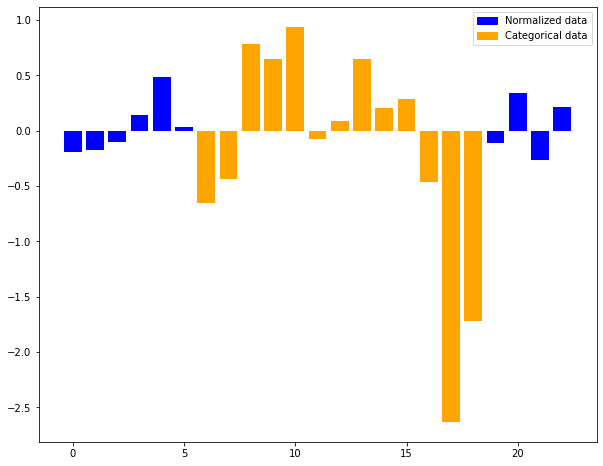

In [90]:
importance = reg.coef_[0]
for i,v in enumerate(importance):
	print('Feature: %s, Score: %.5f' % (x_train.columns[i],v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance,color = ['blue','blue','blue','blue','blue','blue','orange','orange','orange','orange','orange','orange','orange','orange','orange','orange','orange','orange','orange','blue','blue','blue','blue'])
blue = mpatches.Patch(color='blue', label='Normalized data')
orange = mpatches.Patch(color='orange', label='Categorical data')
plt.legend(handles=[blue,orange])
plt.show()

In [91]:
print('Standard deviation of metro dist: ',np.round(std_metro_dist,0))
print('Standard deviation of center dist: ',np.round(std_center_dist,0))

Standard deviation of metro dist:  836.0
Standard deviation of center dist:  1581.0


## Discussion and Conclusion

### The initial Data
The data consists of many variables that don't explain the prices very well. Variables, that are assumed to have a big influence on the price are date(time of year), size of the listing, and number of people there are room for in the listing. On the website for Airbnb, you can see which type of bed you are sleeping in and what the listing is equipped with, which is assumed to have a big influence on the price. So in order to get better results, more and better data is necessary. 

### Performance of models and most important variables
The performance of the three different classifiers were close, with the NN performing slightly better than the LogReg. The improved performance is good, but the transparency of the LogReg classifier outweighs the small improvement gain of the NN, which makes the LogReg the preferred classifier in this case. For the multi-class classification the NN performed slightly worse, than in the case of two classes. This is expected, since classifying the data into smaller categories will generally be more difficult for a classifier.

The most important variables according to LogReg is the roomtype dummies. They are somewhat the only variable that actually describe the inside of the appartment/house. For instance the private room dummy, has the largest effect on the price compared to all other categorical data. For the standardized data the availability is the most important features accoring to the LogReg. If a listing is available all year, it might indicate that it is an commercial airbnb, and this might be why it correlates with higher prices. This could be further explored in a future project.

### Inclusion of metro stops
As for the additional exploratory research, no major improvement were observed. This could be due to varying nature of the airbnb apartments in Copenhagen. Perhaps the distance to a metro stop is important, but not in a simple way. The poor performance gain might also be due to the low variance in the feature. 

### Inclusion of distance to city center
After including the distance to the city center, a larger improvement of the f1-score was observed. The distance to the city center seems to have a negative correlation with the price, which indicates that appartments are generally more expensive closer to the city center, which is to be expected. The distribution of the distance to the city center of the appartments was much more spread out. The standard deviation on the training data for the non-standardized data for metro distance was 836, while it was 1581 for the center distance. Having a larger spread can generally be a good property of a predictor.

Overall we saw improvements when introducing additional relevant data. The data introduced was all location based, but other properties could perhaps be more relevant.  

### Conlusion 

Overall we saw a relatively good result when predicting the prices, especially when taking into account, that the data doesn't contain information about the room/apartment/house itself. This was supported by the fact that the room type was the most important variable.

## Contribution Matrix
| Part | Name(s) |
| :- | -: |
| Initial Data Analysis | Johan, Ellen, Jonathan
| Prediction | Johan, Ellen, Jonathan
| PCA | Ellen
| Metro Stops | Jonathan, Johan
| City Center | Jonathan, Johan
| Discussion & Conclusion | Johan, Jonathan, Ellen